## Imports

Ultralytics version 8.3.0+ is mandatory for yolo11

In [1]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
from PIL import Image
from collections import deque

In [2]:
import ultralytics
from ultralytics import YOLO
ultralytics.__version__

'8.3.0'

## Read dataset

In [3]:
# Define the dataset_path
dataset_path = './datasets/potholes/final/'
# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

In [4]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):  
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")     

Number of training images: 2802
Number of validation images: 495
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


## Preview some images

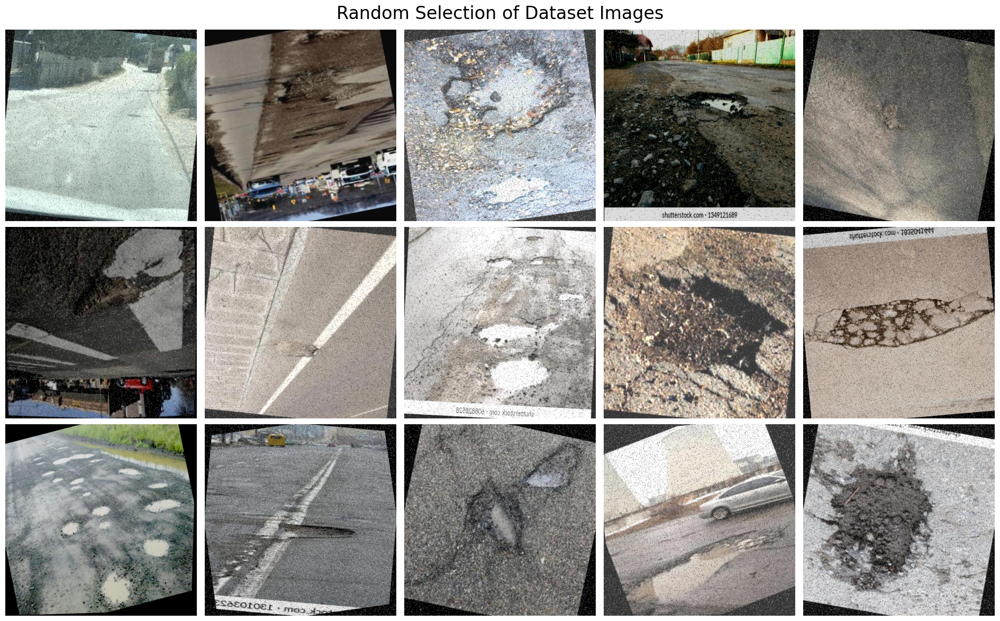

In [5]:
# Set the seed for the random number generator
random.seed(0)

# Create a list of image files
image_files = [f for f in os.listdir(train_images_path) if f.endswith('.jpg')]

# Randomly select 15 images
random_images = random.sample(image_files, 15)

# Create a new figure
plt.figure(figsize=(19, 12))

# Loop through each image and display it in a 3x5 grid
for i, image_file in enumerate(random_images):
    image_path = os.path.join(train_images_path, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

# Add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()

# Deleting unnecessary variable to free up memory
del image_files

## Load model and train

uncomment to test!

In [6]:
# Load the pre-trained YOLOv8 nano segmentation model
model = YOLO('yolo11n-seg.pt')  # versions: n, s, m, l, x. The model will be downloaded to the project root dir

In [7]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file (observation: if path in data.yaml are not read, use full path)
    epochs=1,                # Number of epochs to train for. Use more epochs, 1 is set for testing code.
    imgsz=640,               # Size of input images as integer
    patience=0,              # Epochs to wait for no observable improvement for early stopping of training. Use more patience (5-10% of the epoch is ok)
    batch=4,                 # Number of images per batch
    device=0,                # Device to run on, i.e. cuda device=0 or "cpu"
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate 
    lrf=0.01,                # Final learning rate (lr0 * lrf)
    dropout=0.25,            # Use dropout regularization
    seed=42,                 # Random seed for reproducibility
    amp = False              # for cuda
 )    

New https://pypi.org/project/ultralytics/8.3.2 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.0  Python-3.12.5 torch-2.4.1 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
engine\trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=./datasets/potholes/final/data.yaml, epochs=1, time=None, patience=0, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.25, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

train: Scanning D:\JOBS\lemonio-building\research\datasets\potholes\final\train\labels... 2802 images, 17 backgrounds, 0 corrupt: 100%|██████████| 2802/2802 [00:05<00:00, 509.38it/s]


train: New cache created: D:\JOBS\lemonio-building\research\datasets\potholes\final\train\labels.cache


val: Scanning D:\JOBS\lemonio-building\research\datasets\potholes\final\valid\labels... 495 images, 2 backgrounds, 0 corrupt: 100%|██████████| 495/495 [00:01<00:00, 417.25it/s]


val: New cache created: D:\JOBS\lemonio-building\research\datasets\potholes\final\valid\labels.cache
Plotting labels to runs\segment\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\segment\train
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


        1/1      1.56G      1.571      2.915      2.353       1.54         10        640: 100%|██████████| 701/701 [02:47<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:15<00:00,  4.12it/s]


                   all        495        988      0.549      0.395      0.423       0.22      0.542      0.396      0.418      0.215

1 epochs completed in 0.052 hours.
Optimizer stripped from runs\segment\train\weights\last.pt, 6.0MB
Optimizer stripped from runs\segment\train\weights\best.pt, 6.0MB

Validating runs\segment\train\weights\best.pt...
Ultralytics 8.3.0  Python-3.12.5 torch-2.4.1 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
YOLO11n-seg summary (fused): 265 layers, 2,834,763 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:12<00:00,  5.07it/s]


                   all        495        988       0.55      0.395      0.424       0.22      0.537      0.402      0.418      0.215
Speed: 0.6ms preprocess, 10.3ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs\segment\train


In [8]:
# Define the path to the directory
post_training_files_path = './runs/segment/train'  # <--- check if the folder is correct, per execution og the block above, a new folder is created (train, train2, train3,...)

# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.0  Python-3.12.5 torch-2.4.1 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
YOLO11n-seg summary (fused): 265 layers, 2,834,763 parameters, 0 gradients, 10.2 GFLOPs


val: Scanning D:\JOBS\lemonio-building\research\datasets\potholes\final\valid\labels.cache... 495 images, 2 backgrounds, 0 corrupt: 100%|██████████| 495/495 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.26it/s]


                   all        495        988       0.55      0.395      0.424       0.22      0.537      0.402      0.418      0.215
Speed: 0.9ms preprocess, 10.1ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs\segment\val


In [9]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.550
metrics/recall(B),0.395
metrics/mAP50(B),0.424
metrics/mAP50-95(B),0.220
metrics/precision(M),0.537
metrics/recall(M),0.402
metrics/mAP50(M),0.418
metrics/mAP50-95(M),0.215
fitness,0.476


## VISUALIZE SOME OF THE VALIDATION


image 1/1 d:\JOBS\lemonio-building\research\datasets\potholes\final\valid\images\img-1003.jpg: 640x640 1 Pothole, 82.4ms
Speed: 5.1ms preprocess, 82.4ms inference, 11.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 d:\JOBS\lemonio-building\research\datasets\potholes\final\valid\images\img-1326.jpg: 640x640 1 Pothole, 20.7ms
Speed: 2.7ms preprocess, 20.7ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 d:\JOBS\lemonio-building\research\datasets\potholes\final\valid\images\img-1620.jpg: 640x640 (no detections), 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 d:\JOBS\lemonio-building\research\datasets\potholes\final\valid\images\img-2032.jpg: 640x640 (no detections), 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 7.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 d:\JOBS\lemonio-building\research\datasets\potholes\final\valid\images\img-2410.jpg: 640x640 2 Potho

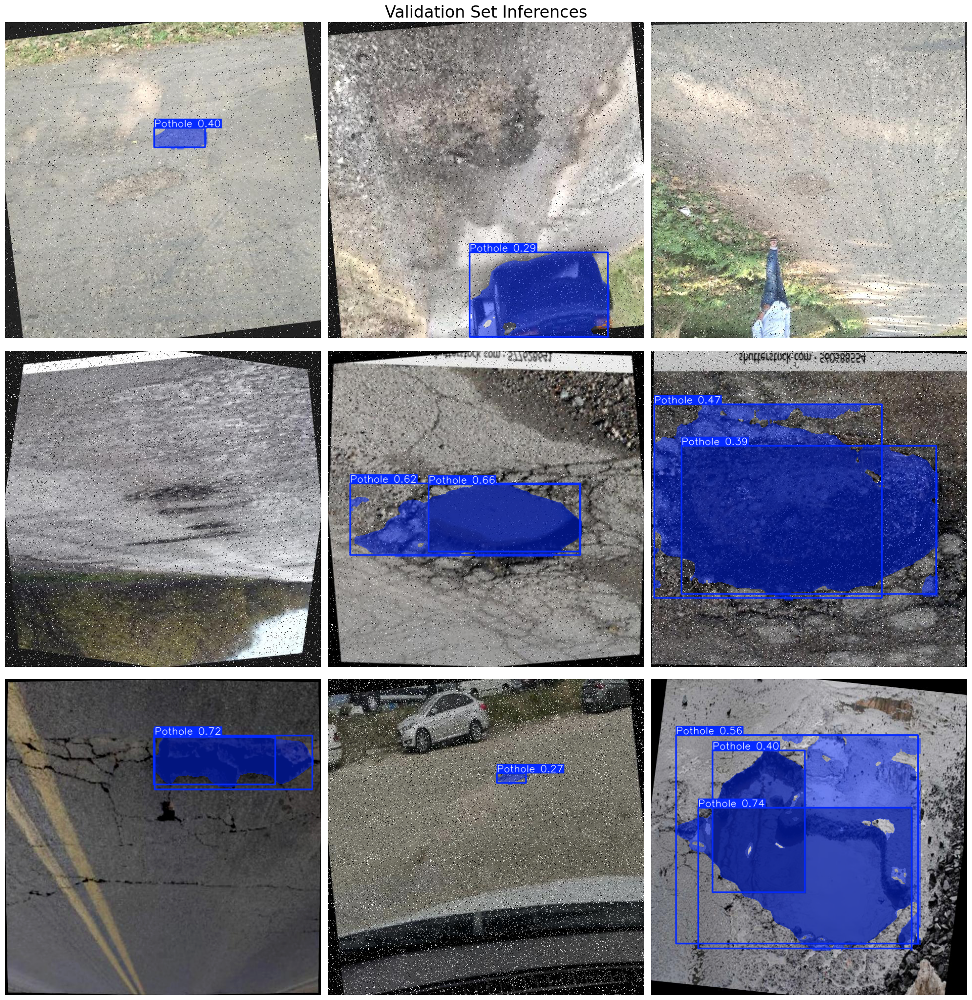

In [10]:

# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

## Export the model

Advance topic

This is usefull when you need to use the model trained in other frameworks, or hardware.

In [11]:
best_model.export(format='onnx')

Ultralytics 8.3.0  Python-3.12.5 torch-2.4.1 CPU (AMD Ryzen 5 4600H with Radeon Graphics)

PyTorch: starting from 'runs\segment\train\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (5.7 MB)

ONNX: starting export with onnx 1.16.2 opset 19...
ONNX: slimming with onnxslim 0.1.34...
ONNX: export success  2.5s, saved as 'runs\segment\train\weights\best.onnx' (11.1 MB)

Export complete (3.1s)
Results saved to D:\JOBS\lemonio-building\research\runs\segment\train\weights
Predict:         yolo predict task=segment model=runs\segment\train\weights\best.onnx imgsz=640  
Validate:        yolo val task=segment model=runs\segment\train\weights\best.onnx imgsz=640 data=./datasets/potholes/final/data.yaml  
Visualize:       https://netron.app


'runs\\segment\\train\\weights\\best.onnx'